In [1]:
import numpy as np 
import cv2
import PIL
from tools import display_inline, display_multiple_inline, scaler

In [2]:
# import sys
# np.set_printoptions(threshold=sys.maxsize)

In [3]:
path = 'example.jpg'
img = cv2.imread(path)
img = scaler(img, 3)

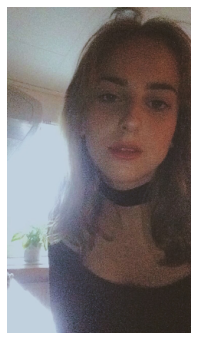

In [4]:
display_inline(img)

#### **Задание 1. Сравнение различных методов сглаживания**
1. Считать изображение с ярко выраженным шумом (например, шум «соль и перец» и/или гауссовский шум).  
2. Применить последовательно три фильтра сглаживания: **Box Blur**, **Gaussian Blur** и **Median Blur**.  
3. Для каждого результата визуально оценить, насколько хорошо удалён шум и сохранены детали. Дополнительно, при наличии «чистого» эталона, вычислить метрики MSE или PSNR.  
4. Сравнить, какой метод сглаживания справляется с шумом лучше, и обсудить его влияние на мелкие детали изображения.

In [5]:
ksize = (5,5) 

In [6]:
img_blur = cv2.blur(img, ksize)
img_blur_gaus = cv2.GaussianBlur(img, ksize, 0)
img_blur_med = cv2.medianBlur(img, 5)

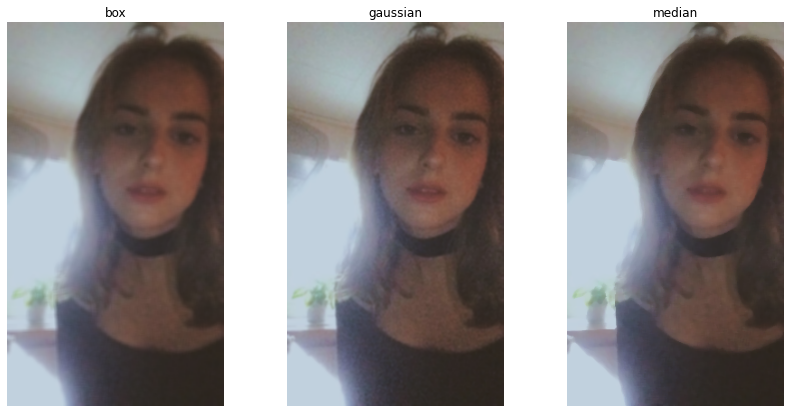

In [7]:
display_multiple_inline([img_blur, img_blur_gaus, img_blur_med], 3, img_titles=['box', 'gaussian', 'median'], base_sizes=(4,6))

#### **Задание 2. Усиление резкости методом Unsharp Masking**
1. Выбрать изображение с множеством мелких деталей (текстуры, тонкие линии).  
2. Выполнить гауссовое размытие (например, с ядром 7×7 и \(\sigma\approx2\)).  
3. Реализовать формулу Unsharp Masking: \(\displaystyle I_{\text{sharpened}} = I + \alpha \,(I - I_{\text{blurred}})\), перебирая несколько значений \(\alpha\) (0.5, 1.0, 1.5, 2.0).  
4. Сравнить полученные результаты и отметить появление «ореолов» или артефактов при больших \(\alpha\).

In [8]:
path = 'example2.jpg'
img2 = cv2.imread(path)
img2 = scaler(img2, 4)

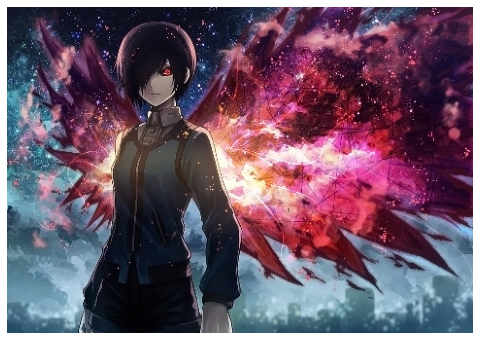

In [9]:
display_inline(img2)

In [10]:
img2_gaus = cv2.GaussianBlur(img2, (7,7), (2))
img2_substract_gaus = np.where(img2 > img2_gaus, img2 - img2_gaus, 0)

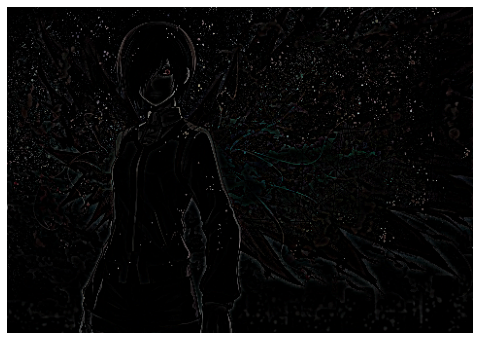

In [11]:
display_inline(img2_substract_gaus)

In [12]:
alphas = [0.5, 1.0, 1.5, 2.0]
num_images = len(alphas)
images = np.empty((num_images, *img2.shape), dtype=np.float32) 

for i, alpha in enumerate(alphas):
    cur_img = np.where(img2 + img2_substract_gaus * alpha <= 255, img2 + img2_substract_gaus * alpha, 255) # without this we get darker image
    cur_img = (cur_img - cur_img.min()) / (cur_img.max() - cur_img.min())
    images[i] = cur_img

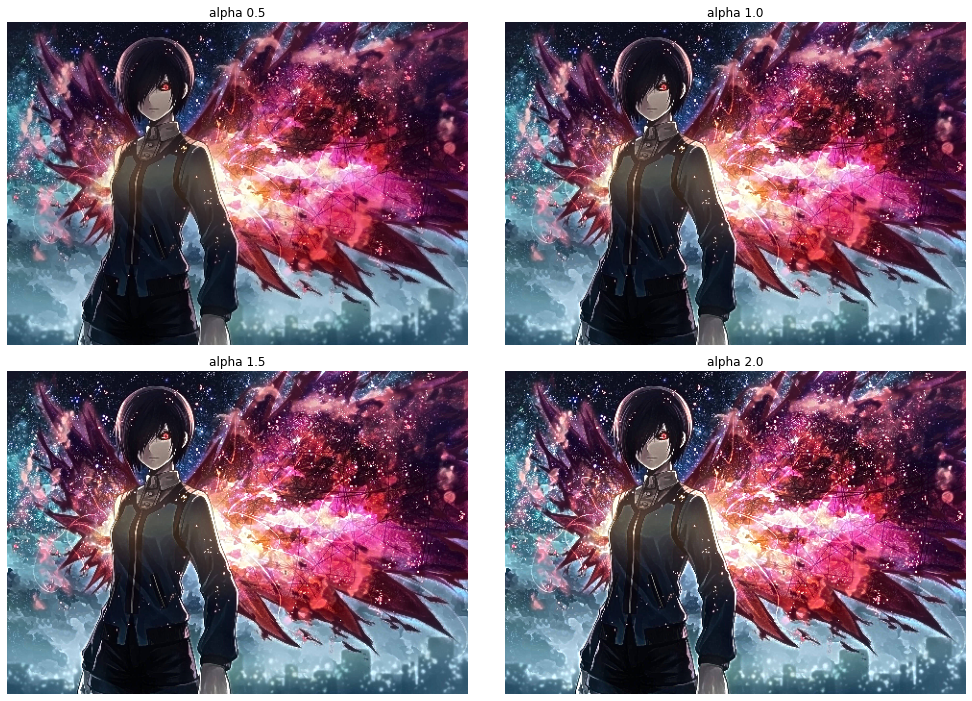

In [13]:
display_multiple_inline(images, 2, img_titles=[f'alpha {x}' for x in alphas], base_sizes=(7,5))

#### **Задание 3. Адаптивная пороговая сегментация и морфология**
1. Считать изображение, имеющее неравномерное освещение (например, скан документа с тенями).  
2. Преобразовать в оттенки серого и применить адаптивную пороговую обработку (`cv2.adaptiveThreshold`) с методами `MEAN_C` и `GAUSSIAN_C`.  
3. Полученную бинарную маску очистить морфологической операцией **opening** (эрозия → дилатация) для удаления белых шумовых точек.  
4. Сравнить исходные двоичные изображения и те, что прошли морфологическую очистку. Обсудить, насколько улучшилось качество сегментации.

In [14]:
path = 'example3.jpg'
img3 = cv2.imread(path)
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)
img3_blur = cv2.GaussianBlur(img3, (5,5), 0)

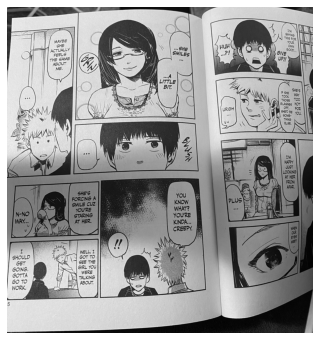

In [15]:
display_inline(img3)

In [16]:
img3_adapt_mean = cv2.adaptiveThreshold(img3,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,31,20)
img3_adapt_gaus = cv2.adaptiveThreshold(img3,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,31,20)

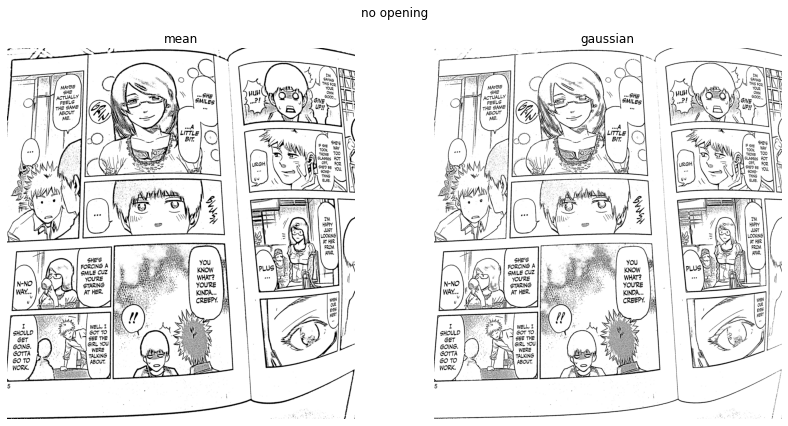

In [17]:
display_multiple_inline([img3_adapt_mean, img3_adapt_gaus], 2, img_titles=['mean', 'gaussian'], title='no opening', base_sizes=(6,6))

In [18]:
kernel = np.ones((5,5), np.uint8)
img3_adapt_mean_open = cv2.dilate(cv2.erode(img3_adapt_mean, kernel), kernel)
img3_adapt_gaus_open = cv2.dilate(cv2.erode(img3_adapt_gaus, kernel), kernel)

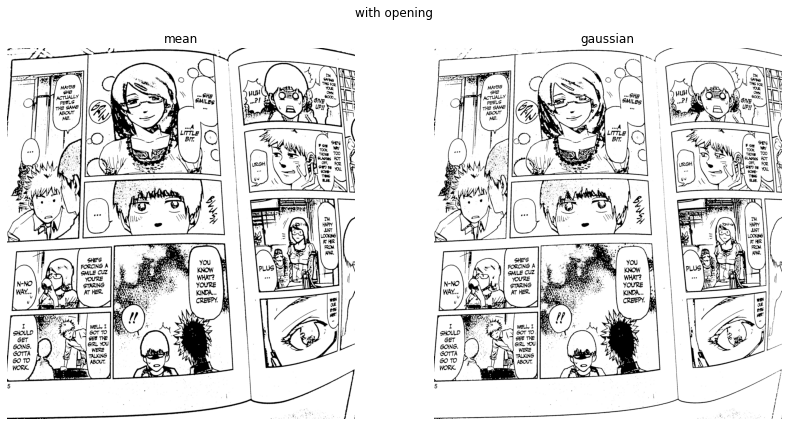

In [19]:
display_multiple_inline([img3_adapt_mean_open, img3_adapt_gaus_open], 2, img_titles=['mean', 'gaussian'], title='with opening', base_sizes=(6,6))

#### **Задание 4. Устранение шума «соль и перец» с помощью медианного фильтра и морфологии**
1. Искуственно добавить к выбранному изображению шум типа «соль и перец» (заменив случайные пиксели на 0 и 255).  
2. Применить медианный фильтр (`cv2.medianBlur`) с ядрами 3×3, 5×5, 7×7 и сравнить результаты.  
3. Преобразовать изображение в бинарное (пороговая сегментация) и попробовать удалить шумовые точки с помощью морфологического **открытия** (разные размеры ядра).  
4. Сравнить оба подхода (чисто медианная фильтрация vs. морфология) и сделать выводы о достоинствах и недостатках каждого в разных сценариях.

In [20]:
from tools import get_noised_image

In [21]:
path = 'example4.webp'
img4 = cv2.imread(path)

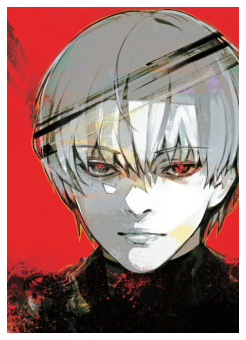

In [22]:
display_inline(img4)

In [23]:
img4_noised = get_noised_image(img4, sp=True)

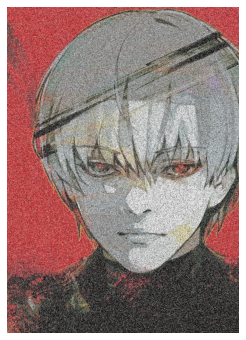

In [24]:
display_inline(img4_noised)

In [25]:
def apply_median_blur(img, kernel):
    return cv2.medianBlur(img, kernel)

In [26]:
from tools import iterative_filter

In [27]:
kernels_median = [3, 5, 7]
params_median = [{"kernel": k} for k in kernels_median]

img4_blurred = iterative_filter(img4_noised, params_median, apply_median_blur)

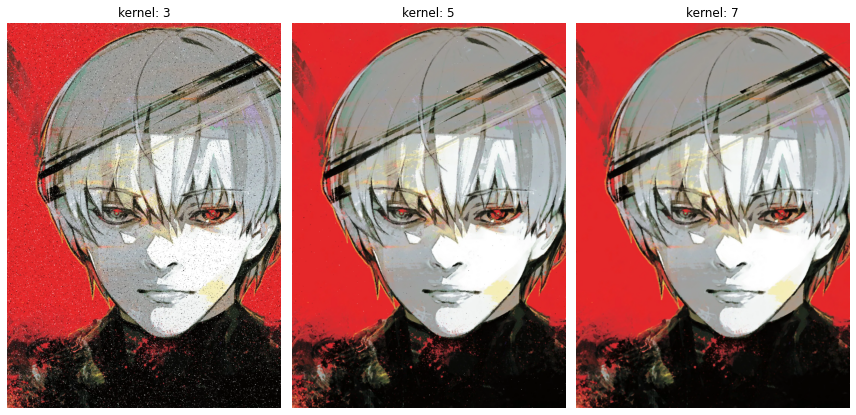

In [28]:
display_multiple_inline(img4_blurred, \
                        cols=len(kernels_median), \
                        base_sizes=(4,6), \
                        img_titles=[f'kernel: {k}' for k in kernels_median])

In [29]:
def open_image(img, **params):
    b, g, r = cv2.split(img)
    
    def open(channel, **params):
        return cv2.dilate(cv2.erode(channel, **params), **params)
    
    return cv2.merge([open(b, **params), open(g, **params), open(r, **params)]) 

In [30]:
def open(channel, **params):
        return cv2.dilate(cv2.erode(channel, **params), **params)

In [31]:
kernels_opening = [np.ones((i,i), np.uint8) for i in [3, 5, 7]]
iterations_opening = list(range(5))

combinations_opening = []
for kernel in kernels_opening:
    for iteration in iterations_opening:
        combinations_opening.append({'kernel': kernel, 'iterations': iteration})

In [32]:
img4_erode_dilate = iterative_filter(img4_noised, combinations_opening, open_image)

c:\Users\xrosn\Python Projects\hse\cv\sem3\tools.py:146: RuntimeWarning: invalid value encountered in divide
  cur_img = (cur_img - cur_img.min()) / (cur_img.max() - cur_img.min())


c:\Users\xrosn\anaconda3\lib\site-packages\matplotlib\cm.py:440: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


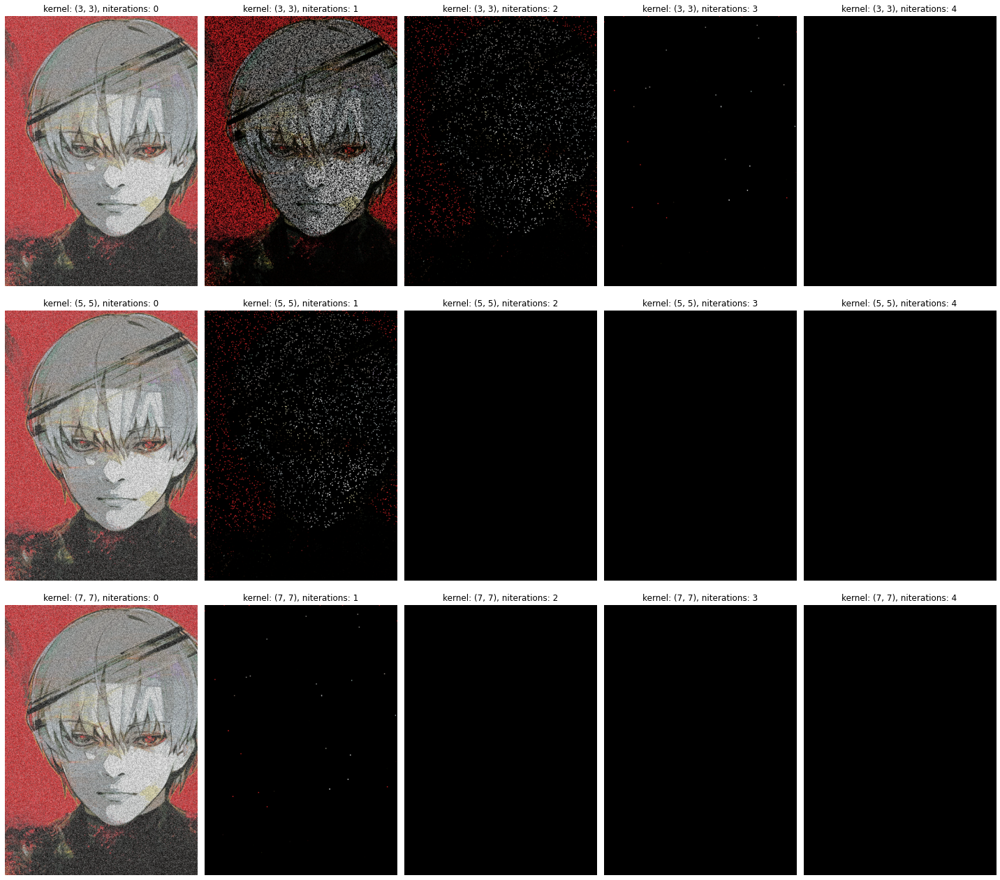

In [33]:
display_multiple_inline(img4_erode_dilate, \
                        cols=len(iterations_opening), \
                        base_sizes=(4,6), \
                        img_titles=[f"kernel: {comb['kernel'].shape}, niterations: {comb['iterations']}" \
                                    for comb in combinations_opening])

In [34]:
path = 'example5.webp'
img5 = cv2.imread(path)
img5 = cv2.cvtColor(img5, cv2.COLOR_BGR2GRAY)

img5_noised = get_noised_image(img5, threshold=0.1, sp=True)

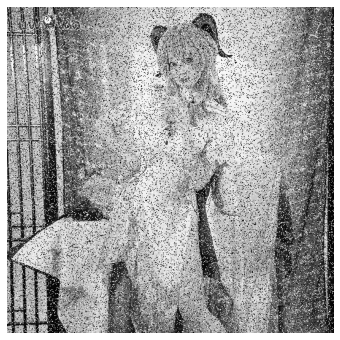

In [35]:
display_inline(img5_noised)

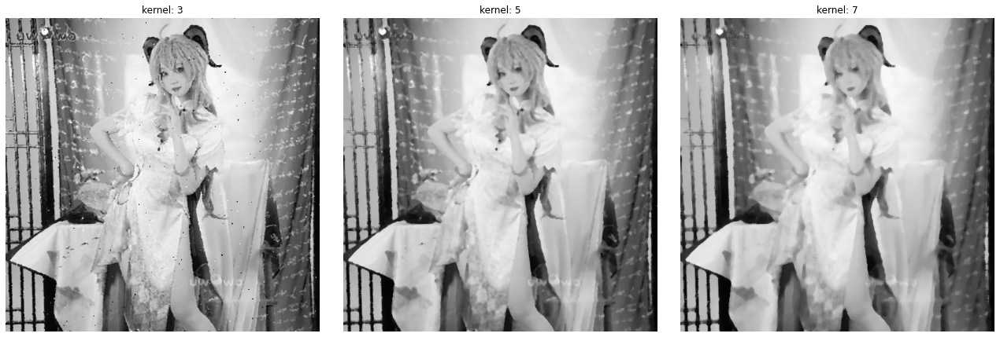

In [36]:
img5_blurred = iterative_filter(img5_noised, params_median, apply_median_blur)

display_multiple_inline(img5_blurred, \
                        cols=len(kernels_median), \
                        base_sizes=(6,6), \
                        img_titles=[f'kernel: {k}' for k in kernels_median])

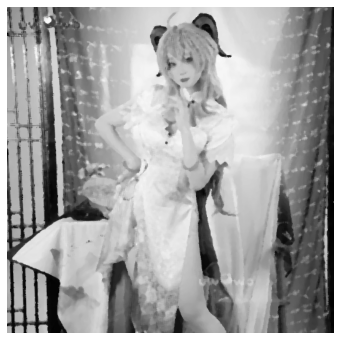

In [37]:
display_inline(img5_blurred[1], grey=True)

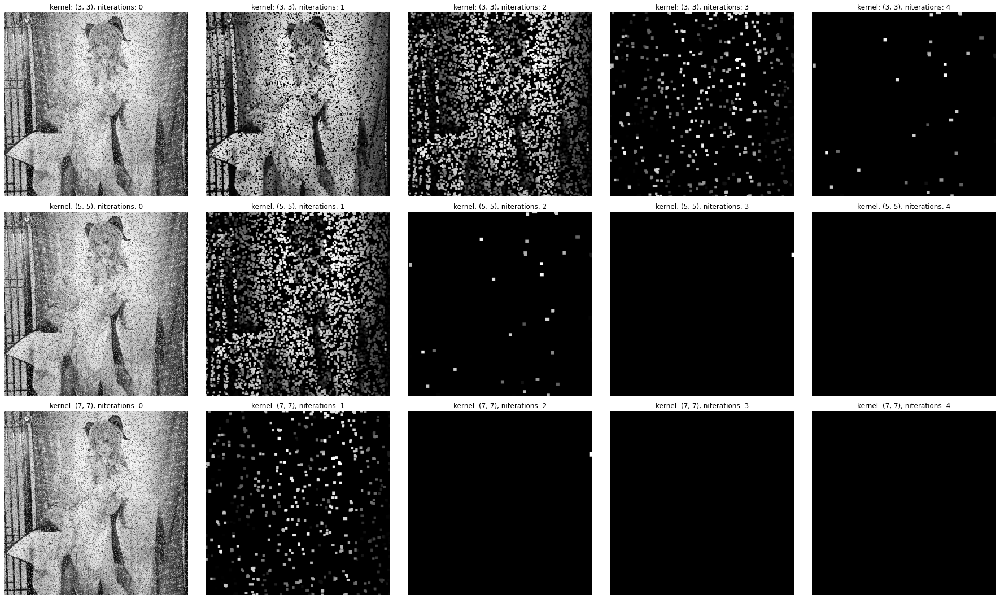

In [38]:
img5_erode_dilate = iterative_filter(img5_noised, combinations_opening, open_image)

display_multiple_inline(img5_erode_dilate, \
                        cols=len(iterations_opening), \
                        base_sizes=(5,5), \
                        img_titles=[f"kernel: {comb['kernel'].shape}, niterations: {comb['iterations']}" \
                                    for comb in combinations_opening])

In [39]:
path = 'example6.webp'
img6 = cv2.imread(path)
img6 = cv2.cvtColor(img6, cv2.COLOR_BGR2GRAY)

img6_noised = get_noised_image(img6, threshold=0.1, sp=True)

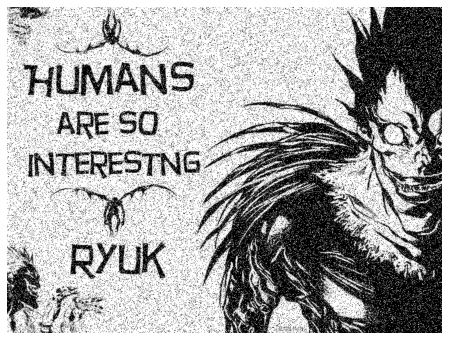

In [40]:
display_inline(img6_noised)

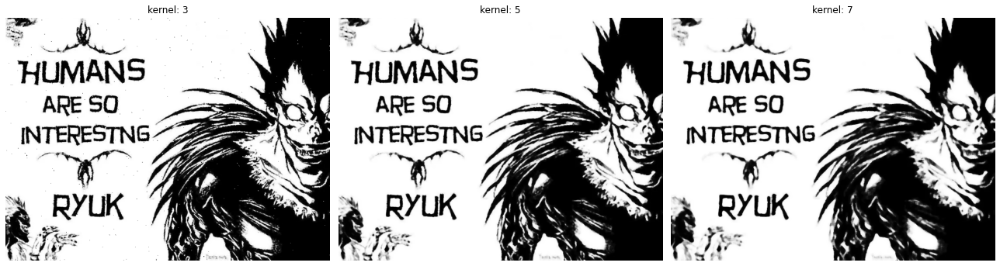

In [41]:
img6_blurred = iterative_filter(img6_noised, params_median, apply_median_blur)

display_multiple_inline(img6_blurred, \
                        cols=len(kernels_median), \
                        base_sizes=(6,6), \
                        img_titles=[f'kernel: {k}' for k in kernels_median])

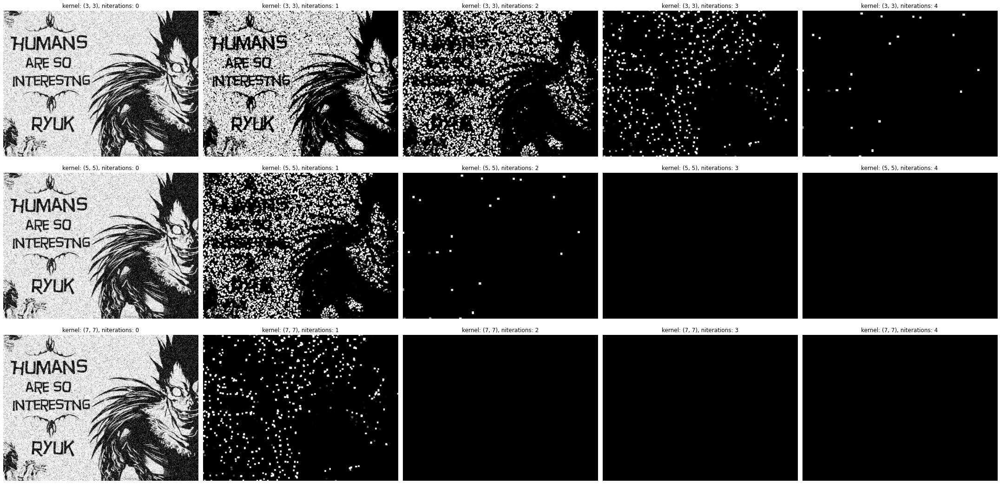

In [42]:
img6_erode_dilate = iterative_filter(img6_noised, combinations_opening, open_image)

display_multiple_inline(img6_erode_dilate, \
                        cols=len(iterations_opening), \
                        base_sizes=(6,5), \
                        img_titles=[f"kernel: {comb['kernel'].shape}, niterations: {comb['iterations']}" \
                                    for comb in combinations_opening])

#### **Задание 5. Выделение контуров с помощью морфологического градиента**
1. Считать бинарное изображение (или получить бинарную маску после порога).  
2. Определить **морфологический градиент** как разницу между дилатированным и эродированным вариантом одной и той же маски.  
3. Сравнить полученный контур с результатами операторов Собеля или Канни (если применяли к исходному изображению).  
4. Проанализировать, в чём заключаются отличия по точности и толщине контуров в каждом случае.

In [43]:
kernel = (3,3)

img6_erode = cv2.erode(img6, kernel=kernel)
img6_dilate = cv2.dilate(img6, kernel=kernel)

img6_ed_dil_dif = np.where(img6_dilate > img6_erode, img6_dilate - img6_erode, 0)

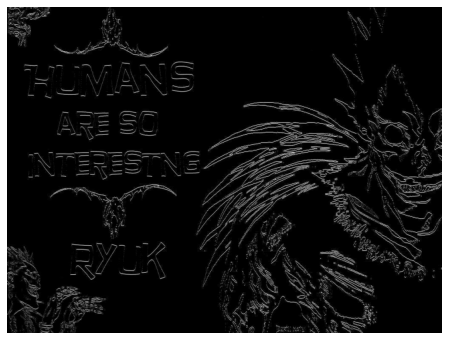

In [44]:
display_inline(img6_ed_dil_dif, grey=True)

In [45]:
def get_sobel(img, **params):
    gX = cv2.Sobel(img, dx=1, dy=0, **params)
    gY = cv2.Sobel(img, dx=0, dy=1, **params)
    
    gX = cv2.convertScaleAbs(gX)
    gY = cv2.convertScaleAbs(gY)

    return cv2.addWeighted(gX, 0.5, gY, 0.5, 0)

In [46]:
kernels = [3, 5, 7, 11]
ddepths = [cv2.CV_32F, cv2.CV_64F]

combinations_sobel = []
for kernel in kernels:
    for ddepth in ddepths:
        combinations_sobel.append({'ksize': kernel, 'ddepth':ddepth})

In [47]:
# params = [{'ksize': 3, 'dx':0, 'dy':1, 'ddepth':cv2.CV_32F},
#           {'ksize': 3, 'dx':1, 'dy':0, 'ddepth':cv2.CV_32F}]

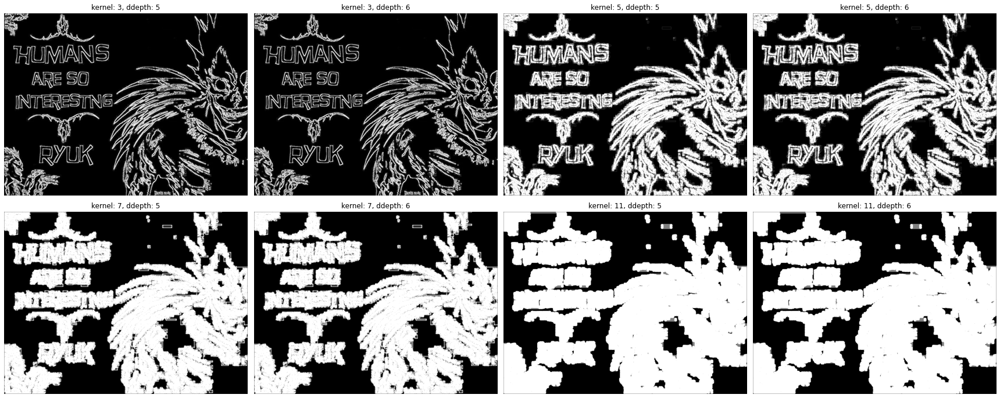

In [48]:
img6_sobel = iterative_filter(img6, combinations_sobel, get_sobel)

display_multiple_inline(img6_sobel, \
                        cols=4, \
                        base_sizes=(6,5), \
                        img_titles=[f"kernel: {param['ksize']}, ddepth: {param['ddepth']}" \
                                    for param in combinations_sobel])

#### **Задание 6. Использование Top-hat и Black-hat для поиска мелких деталей**
1. Считать полутоновое (grayscale) изображение с неравномерным фоном.  
2. Применить операции `Top-hat (I - Opening(I))` и `Black-hat (Closing(I) - I)` с ядром 15×15 (или иным размером).  
3. Визуализировать результаты: какие светлые/тёмные «мелкие» элементы были выделены?  
4. Попробовать вычесть полученные карты из исходного изображения, чтобы сгладить фон или убрать мелкие артефакты.

In [49]:
img2_grey = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

In [50]:
kernel_size = (5,5)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)

In [51]:
img2_tophat = cv2.morphologyEx(img2_grey, cv2.MORPH_TOPHAT, kernel)
img2_blackhat = cv2.morphologyEx(img2_grey, cv2.MORPH_BLACKHAT, kernel)

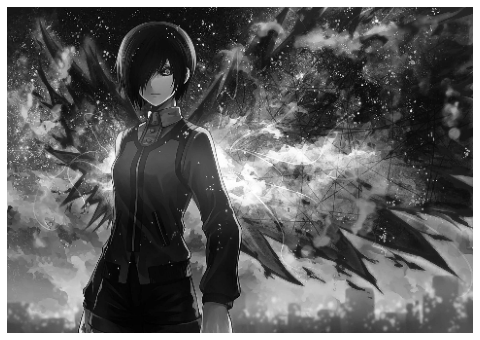

In [52]:
display_inline(img2_grey, grey=True)

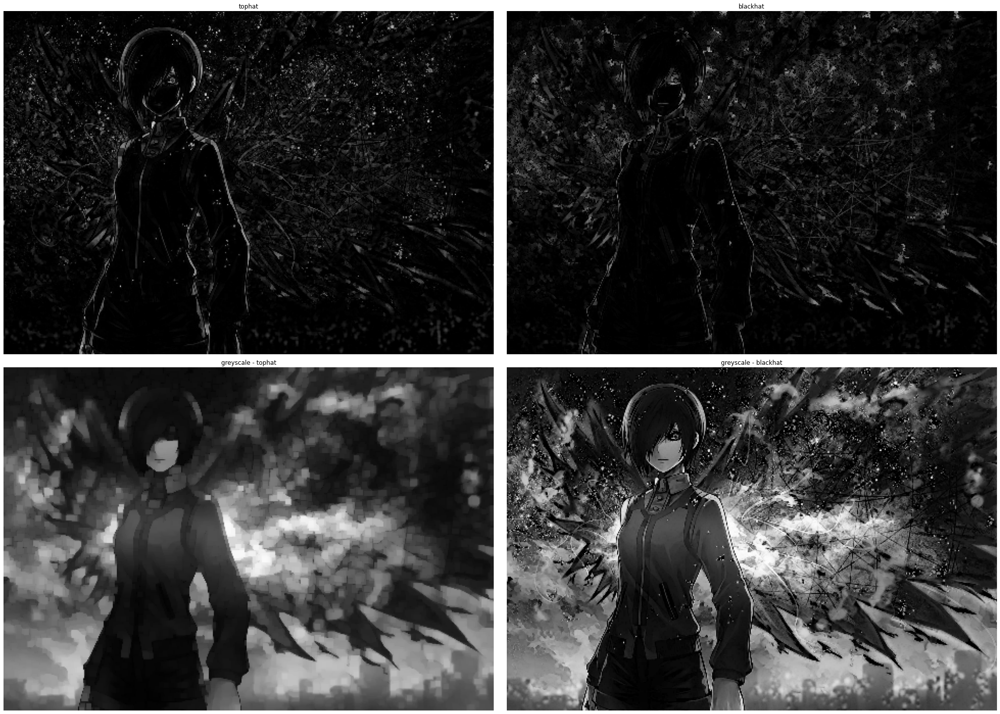

In [53]:
display_multiple_inline([img2_tophat, img2_blackhat, \
                         np.where(img2_grey > img2_tophat, img2_grey - img2_tophat, 0), \
                         np.where(img2_grey > img2_blackhat, img2_grey - img2_blackhat, 0)], \
                        cols=2, \
                        base_sizes=(14,10), \
                        img_titles=['tophat', 'blackhat', 'greyscale - tophat', 'greyscale - blackhat'])

#### **Задание 7. Морфологическая реконструкция**
1. Считать изображение (mask) и подготовить «маркер» (marker) — например, эродированную версию mask.  
2. Реализовать пошаговую дилатацию маркера, на каждом шаге ограничивая результат минимальным значением с mask.  
3. Остановиться, когда маркер перестанет изменяться.  
4. Визуализировать итог реконструкции и, при желании, промежуточные шаги. Объяснить, как «реконструкция» отличается от обычной дилатации.

#### **Задание 8. Очистка маски при детектировании движущихся объектов**
1. Считать видео или серию кадров, применить алгоритм вычитания фона (например, `cv2.createBackgroundSubtractorMOG2()`).  
2. На полученной бинарной маске выполнить морфологические операции **open** и **close** с ядром 3×3 или 5×5, чтобы убрать одиночные шумовые пиксели и заполнить «разрывы» в силуэте.  
3. Сравнить результаты до и после морфологии, оценить, насколько лучше выделились движущиеся объекты.

In [54]:
vid = cv2.VideoCapture('example.mp4')

In [ ]:
"""
fgbg = cv2.createBackgroundSubtractorMOG2()  
  
while(True): 
    ret, frame = vid.read()        
  
    fgmask = fgbg.apply(frame)
    fgmask = open(fgmask, kernel=(5,5), iterations=1)
  
    cv2.imshow('frame', fgmask) 
    k = cv2.waitKey(30) & 0xff
    if k == 27: 
        break
    
vid.release() 
cv2.destroyAllWindows() 
"""

KeyboardInterrupt: 

: 